In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import pickle 
from matplotlib.path import Path
from PIL import Image
import cv2

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from skimage.feature import local_binary_pattern

import glob
import os
import h5py

from utils import get_matrix_points, get_coords

In [2]:
ROWS, COLS = 18, 18

def process_webcam_images(path):
    img = Image.open(path).convert("L")

def get_mirror(m_points, idx, image):
    indices = [(i, j) for i in range(ROWS - 1) for j in range(COLS - 1)]
    N = len(indices)
    state = {'idx': idx}

    x, y = get_coords(state, indices, m_points)

    mirror = extract_polygon_region_cv2_from_image(image, x, y)
    return mirror

def extract_polygon_region_cv2_from_image(img, x_coords, y_coords):
    """
    Extracts a polygonal region from an image and returns it as a new (cropped) image.
    Args:
        img: Input image.
        x_coords, y_coords: Lists of x and y coordinates of polygon vertices.

    Returns:
        Cropped polygon region as a new image.
    """

    # Wczytaj obraz w skali szarości
    # img = np.array(Image.open(img_path).convert('L'))  # -> shape: (H, W), dtype: uint8
    
    # Przekształć punkty wielokąta
    pts = np.array(list(zip(x_coords, y_coords)), dtype=np.int32)
    pts = pts.reshape((-1, 1, 2))
    
    # Maska binarna o tym samym rozmiarze
    mask = np.zeros(img.shape, dtype=np.uint8)
    cv2.fillPoly(mask, [pts], color=255)
    
    # Nałożenie maski
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    
    # Przycięcie do prostokąta ograniczającego
    x, y, w, h = cv2.boundingRect(pts)
    cropped = masked_img[y:y+h, x:x+w]

    return cropped

In [3]:
def get_mirror_from_image_color(m_points, idx, image):
    indices = [(i, j) for i in range(ROWS - 1) for j in range(COLS - 1)]
    N = len(indices)
    state = {'idx': idx}

    x, y = get_coords(state, indices, m_points)

    mirror = extract_polygon_region_cv2_from_image_color(image, x, y)
    return mirror
    
def extract_polygon_region_cv2_from_image_color(img, x_coords, y_coords):
    """
    Extracts a polygonal region from a COLOR image and returns it as a new (cropped) image.
    
    Args:
        img: Input color image (NumPy array).
        x_coords, y_coords: Lists of x and y coordinates of polygon vertices.

    Returns:
        Cropped polygon region as a new image.
    """
    # Make sure the input is a NumPy array
    img = np.array(img)
    
    # Create polygon vertex points
    pts = np.array(list(zip(x_coords, y_coords)), dtype=np.int32)
    pts = pts.reshape((-1, 1, 2))
    
    # --- THIS IS THE ONLY LINE THAT CHANGED ---
    # Create a 2D mask (H, W), not a 3D one, by using img.shape[:2]
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    
    # Draw the filled polygon on the mask
    cv2.fillPoly(mask, [pts], color=255)
    
    # Apply the mask to the original color image
    # This zeroes out everything outside the polygon
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    
    # Crop the image to the bounding rectangle of the polygon
    x, y, w, h = cv2.boundingRect(pts)
    cropped = masked_img[y:y+h, x:x+w]

    return cropped
    
def extract_color_features(image):
    """
    Konwertuje obraz do przestrzeni HSV i oblicza histogram kolorów.
    
    Args:
        image (numpy.ndarray): Obraz w formacie BGR (jak wczytuje OpenCV).
        
    Returns:
        numpy.ndarray: Spłaszczony wektor cech z histogramu HSV.
    """
    # Konwersja obrazu z BGR do HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Obliczenie histogramu dla kanałów H, S, V
    # Definiujemy liczbę przedziałów (bins) dla każdego kanału
    # H: 0-179 (barwa), S: 0-255 (nasycenie), V: 0-255 (jasność)
    hist = cv2.calcHist([hsv_image], [0, 1, 2], None, [8, 4, 4], [0, 180, 0, 256, 0, 256])
    
    # Normalizacja histogramu, aby wartości były w zakresie od 0 do 1
    cv2.normalize(hist, hist)
    
    # Spłaszczenie histogramu do jednowymiarowego wektora cech
    return hist.flatten()

def extract_texture_features(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    radius = 2
    n_points = 8 * radius
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    return hist

# One Image

In [4]:
M_POINTS = get_matrix_points()

## Gray scale

In [14]:
img = Image.open("data/IRCamM1T20250706_144933M.jpg").convert("RGB")

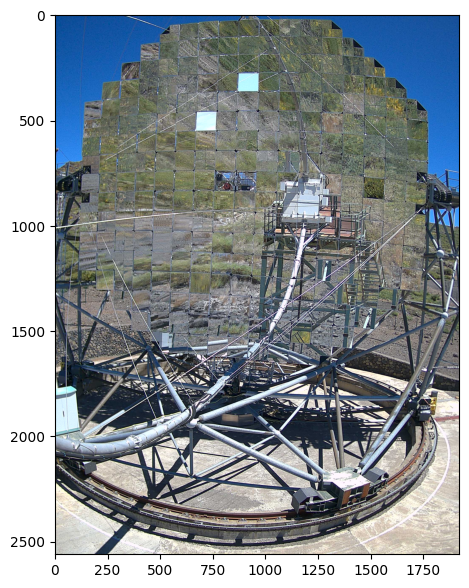

In [13]:
plt.figure(figsize=(12, 7))
plt.imshow(img)

In [15]:
mirrors_list = [get_mirror(M_POINTS, i, np.array(img)) for i in range(289)]

In [16]:
img_color = Image.open("data/IRCamM1T20250706_144933M.jpg").convert("RGB")
mirrors_color_list = [get_mirror_from_image_color(M_POINTS, i, np.array(img_color)) for i in range(289)]

In [35]:
mirrors_list[10].shape

(80, 104)

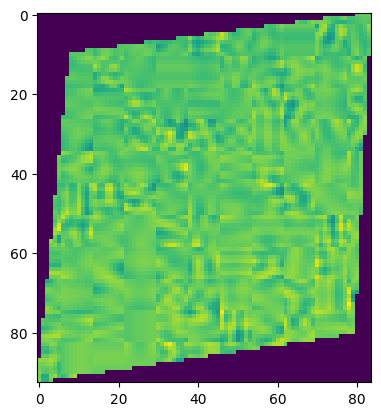

In [18]:
plt.imshow(mirrors_list[0]) # image in gray scale 

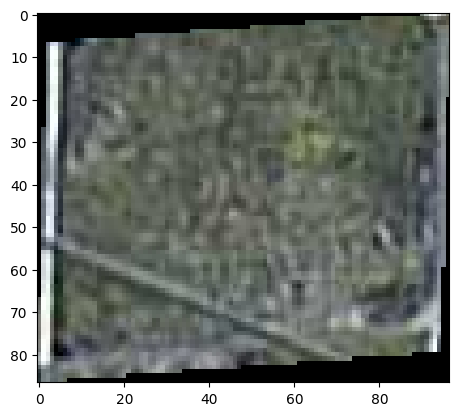

In [23]:
plt.imshow(mirrors_color_list[5]) # image in RGB

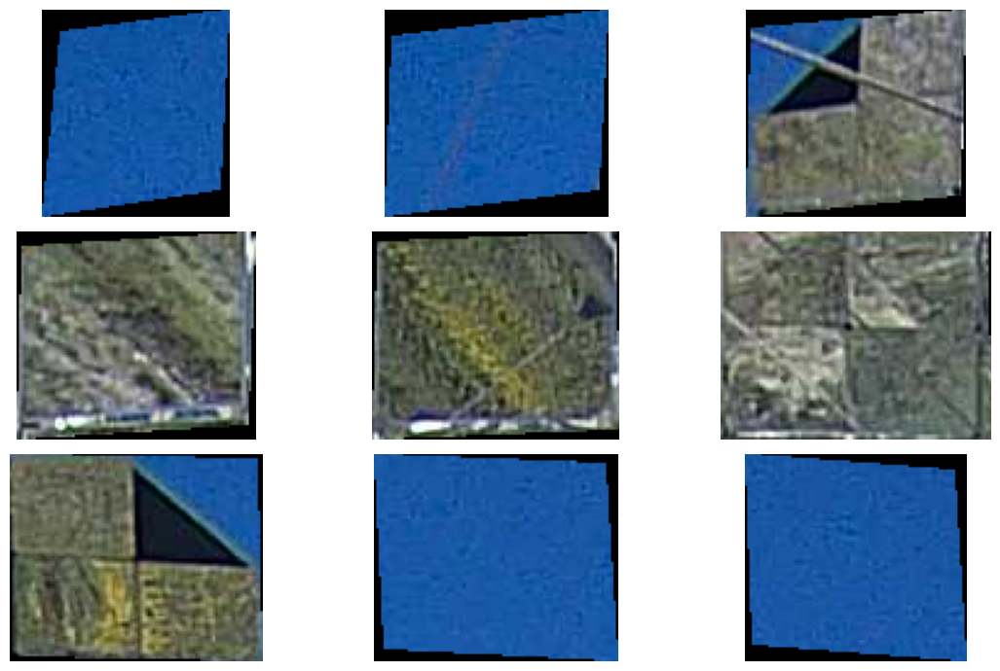

In [26]:
fig, ax = plt.subplots(3, 3, figsize=(12, 7))
ax = ax.flatten()

for i in range(9):
    ax[i].imshow(mirrors_color_list[i*2])
    ax[i].axis("off")

plt.tight_layout()
plt.show()

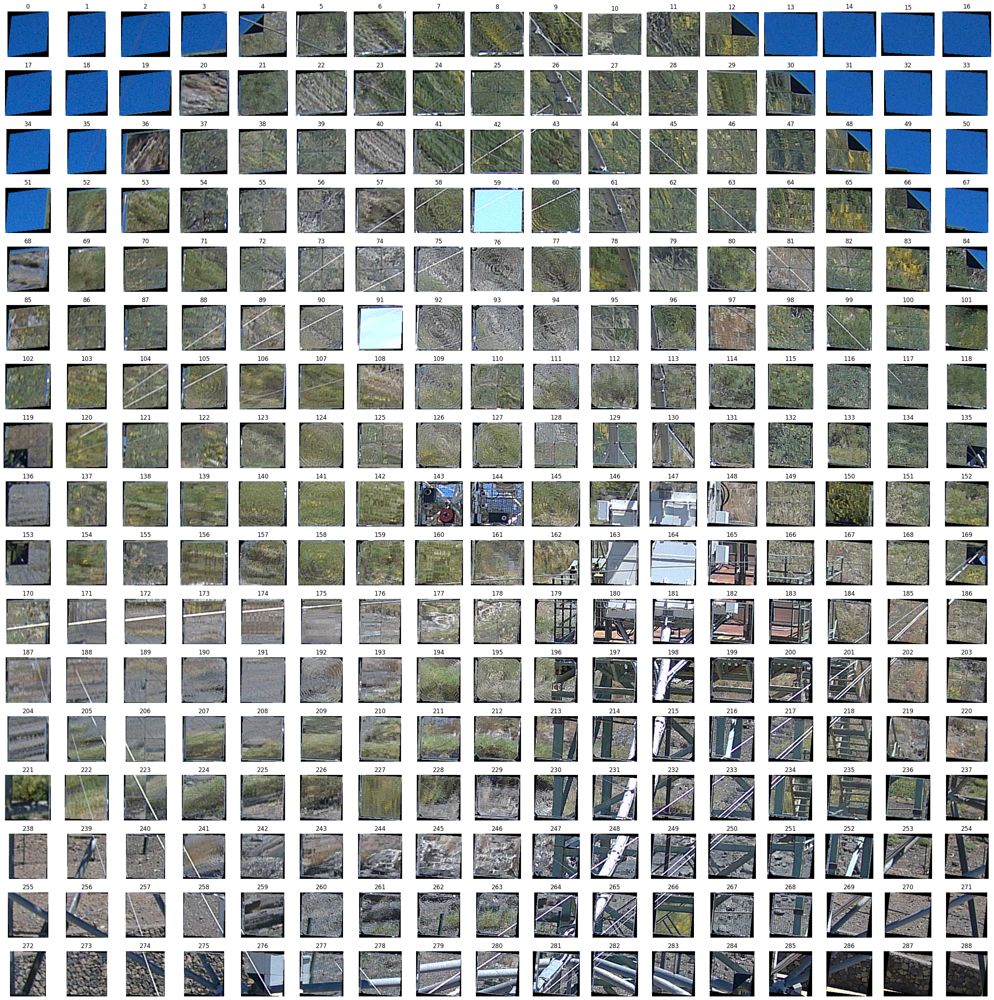

In [34]:
fig, ax = plt.subplots(17, 17, figsize=(28, 28))
ax = ax.flatten()

for i in range(289):
    ax[i].imshow(mirrors_color_list[i])
    ax[i].axis("off")
    ax[i].set_title(i)

plt.tight_layout()
plt.show()

In [32]:
17*17

289

In [25]:
mirrors_color_list[3].shape

(90, 91, 3)

# Cechy koloru

# 1. Cechy Kolorystyczne

Kolor, zwłaszcza ramy, jest jedną z najbardziej oczywistych cech różnicujących lustra.

    Histogram kolorów: To podstawowa i bardzo skuteczna metoda.

        Jak to działa? Dla każdego zdjęcia zlicza się, ile pikseli ma dany kolor (lub odcień). Wynikiem jest wektor liczb (np. o długości 256 dla każdego kanału R, G, B).

        Wskazówka: Zamiast przestrzeni barw RGB, często lepsze wyniki daje HSV (Hue, Saturation, Value). Kanał H (barwa) jest niezależny od oświetlenia, co może pomóc grupować lustra o podobnym kolorze ramy w różnych warunkach oświetleniowych.

    Dominujący kolor / Średni kolor: Prostsza alternatywa dla histogramu.

        Jak to działa? Oblicza się średni kolor wszystkich pikseli lub znajduje kilka dominujących kolorów (np. za pomocą algorytmu K-Means na pikselach). Jest to przydatne do grupowania luster np. na "złote", "czarne", "białe".

## 3. Cechy Tekstury

Tekstura dotyczy głównie ramy – czy jest gładka, rzeźbiona, czy ma wzór (np. słoje drewna).

    LBP (Local Binary Patterns): Bardzo popularny i wydajny deskryptor tekstury.

        Jak to działa? Analizuje otoczenie każdego piksela i na tej podstawie tworzy histogram, który opisuje lokalne wzory na obrazie. Jest odporny na zmiany oświetlenia.

    Macierz współwystępowania poziomów szarości (GLCM): Analizuje, jak często pary pikseli o określonych wartościach i w określonej relacji przestrzennej występują na obrazie. Na jej podstawie można obliczyć cechy takie jak:

        Kontrast: Miara lokalnych zmian na obrazie.

        Energia: Miara jednorodności tekstury.

        Korelacja: Miara zależności liniowej pikseli.

## Funcje do oblicznie cech

Cechy Koloru (Histogram HSV)

    cv2.cvtColor(image, cv2.COLOR_BGR2HSV): OpenCV domyślnie wczytuje obrazy w formacie BGR (Blue-Green-Red). Ta linia zmienia go na HSV, który lepiej oddziela informacje o barwie od informacji o jasności.

    cv2.calcHist(...): To serce operacji.

        [hsv_image]: Obraz wejściowy.

        [0, 1, 2]: Kanały, z których liczymy histogram (0=H, 1=S, 2=V).

        None: Maska, której tu nie używamy.

        [8, 4, 4]: Liczba koszyków (bins) dla każdego kanału. Oznacza to, że podzielimy 180 odcieni barwy (H) na 8 przedziałów, 256 poziomów nasycenia (S) na 4 przedziały i 256 poziomów jasności (V) na 4 przedziały. Możesz eksperymentować z tymi wartościami. Mniejsza liczba koszyków daje krótszy wektor cech, ale jest mniej szczegółowa.

        [0, 180, 0, 256, 0, 256]: Zakresy wartości dla każdego kanału.

    hist.flatten(): Zamienia trójwymiarowy histogram (8x4x4) w płaską listę liczb (o długości 8 * 4 * 4 = 128), która jest Twoim wektorem cech.

Cechy Tekstury (LBP)

    local_binary_pattern(...): Funkcja z scikit-image.

        gray_image: LBP działa na obrazach w skali szarości.

        n_points: Liczba sąsiadów dookoła każdego piksela.

        radius: Odległość tych sąsiadów od centralnego piksela. Te dwa parametry definiują, jak "duże" wzory tekstury analizujesz.

        method='uniform': Popularna metoda, która redukuje liczbę możliwych wzorców LBP, grupując te najważniejsze. Dzięki temu wektor cech jest krótszy i bardziej stabilny.

    np.histogram(...): Po uzyskaniu obrazu LBP (gdzie każdy piksel ma nową wartość odpowiadającą lokalnemu wzorowi) tworzymy z niego histogram, który staje się naszym wektorem cech tekstury.

Ten kod stanowi solidną podstawę. Możesz go łatwo zaadaptować, umieszczając w pętli, aby przetworzyć wszystkie swoje obrazy i zapisać wynikowe wektory cech do późniejszej klasteryzacji.

In [34]:
h = extract_color_features(mirrors_color_list[5])

In [36]:
h.shape

(8, 4, 4)

(array([121.,   2.,   1.,   2.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   1.]),
 array([0.        , 0.05976037, 0.11952073, 0.1792811 , 0.23904146,
        0.29880184, 0.3585622 , 0.41832256, 0.47808293, 0.53784329,
        0.59760368, 0.65736401, 0.7171244 , 0.77688473, 0.83664513,
        0.89640546]),
 <BarContainer object of 15 artists>)

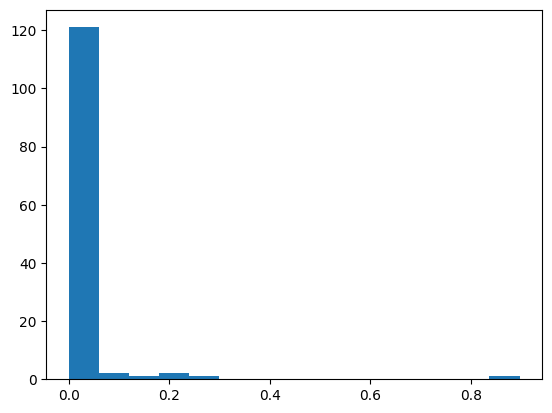

In [32]:
plt.hist(h, bins=15)

In [39]:
features_list = []
for color_img in mirrors_color_list:
    feature_vector = extract_color_features(color_img)
    features_list.append(feature_vector)

data = np.array(features_list)

In [ ]:
features_list = []
for color_img in mirrors_color_list:
    feature_vector = extract_texture_features(color_img)
    features_list.append(feature_vector)

data = np.array(features_list)

In [66]:
features_list = []
for color_img in mirrors_color_list:
    color_f = extract_color_features(color_img)
    texture_f = extract_texture_features(color_img)
    feature_vector = np.concatenate([color_f, texture_f]) 
    features_list.append(feature_vector)

data = np.array(features_list)

In [69]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

k = 4
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
kmeans.fit(scaled_data)
labels = kmeans.labels_

In [74]:
k = 4
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
kmeans.fit(scaled_data)
labels = kmeans.labels_

In [75]:
labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 3, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 3, 0, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0], dtype=int32)

1


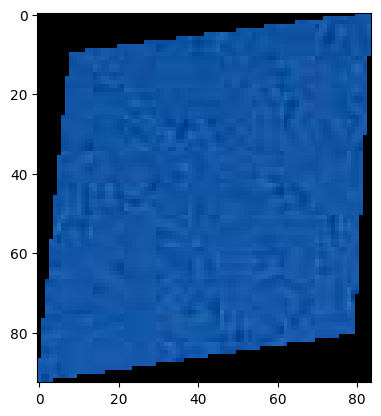

1


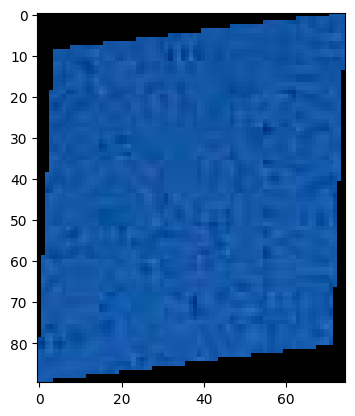

1


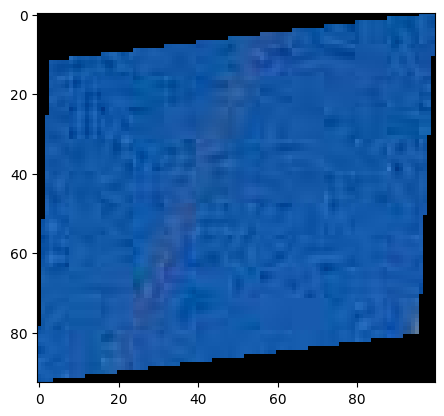

1


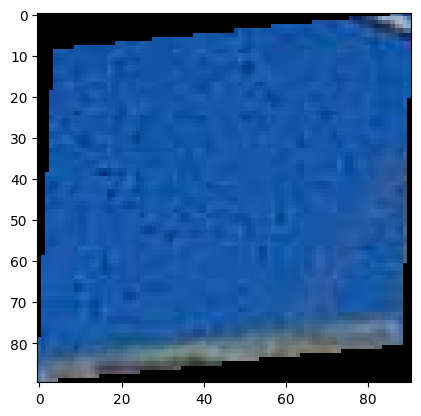

1


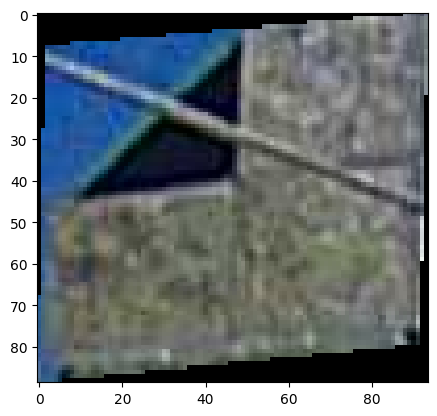

1


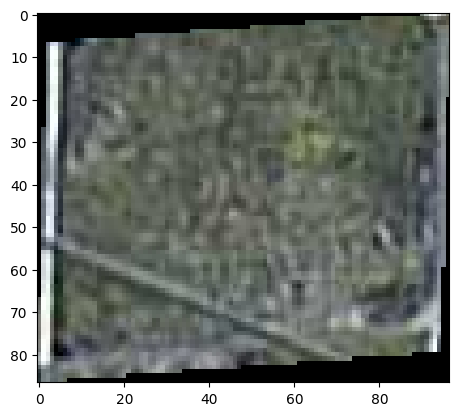

1


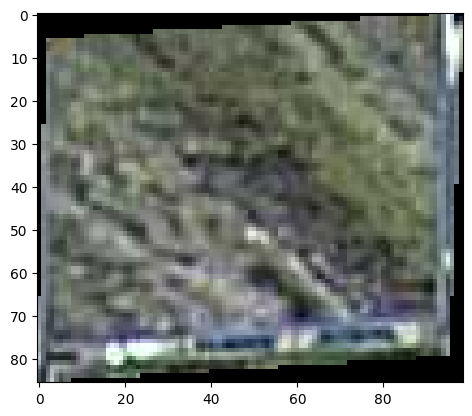

1


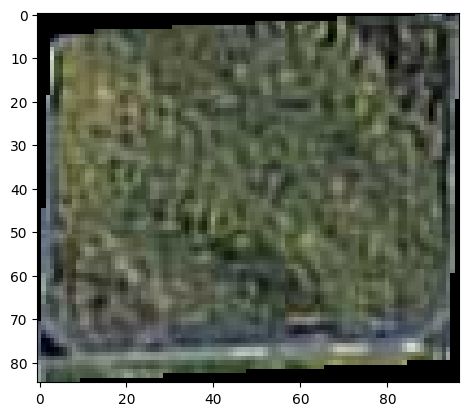

1


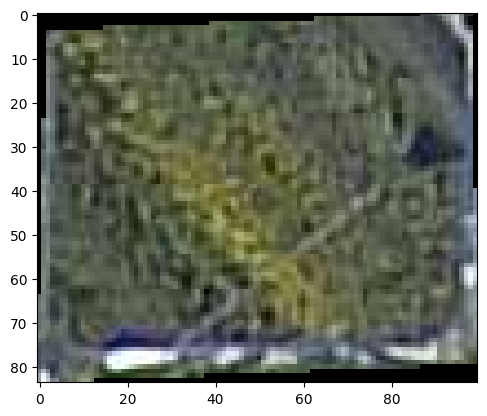

1


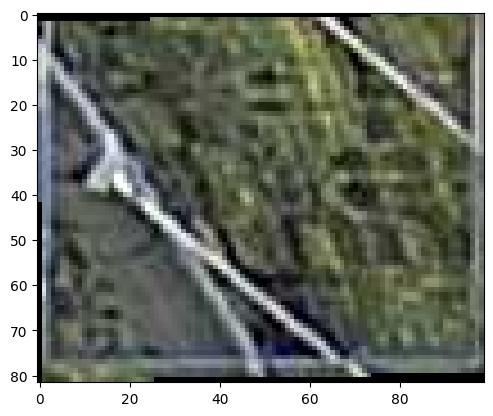

1


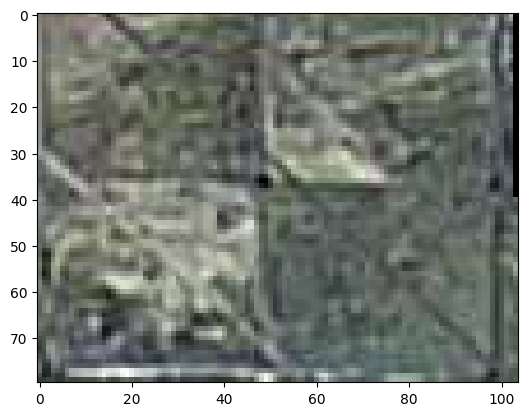

1


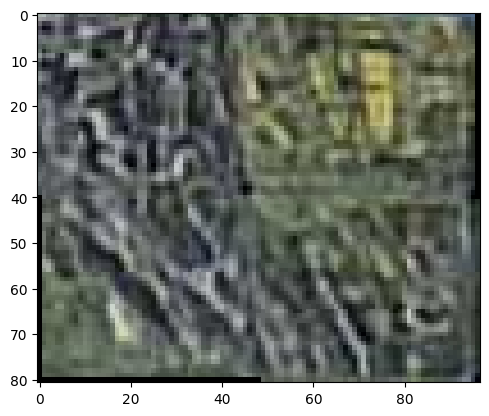

1


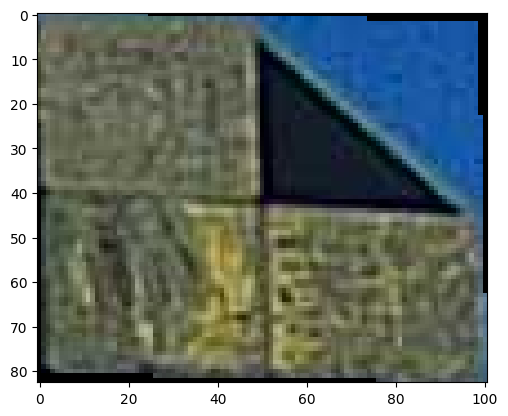

1


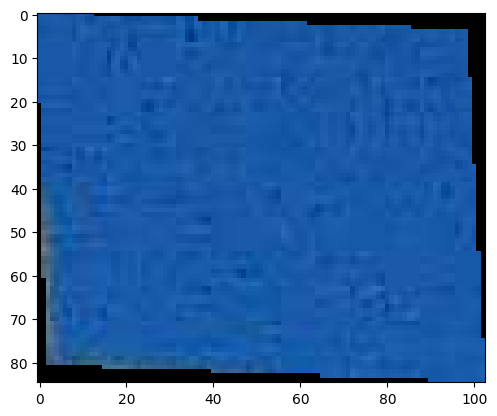

1


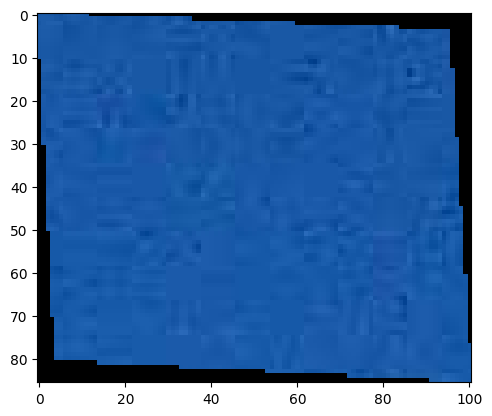

1


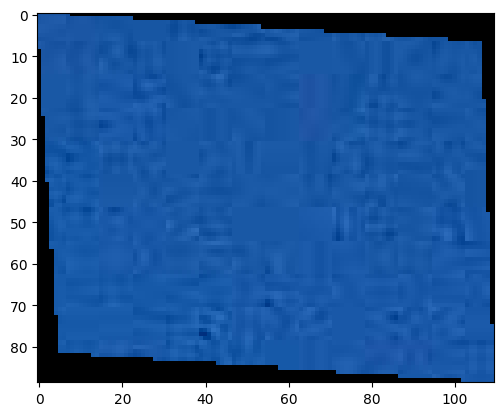

1


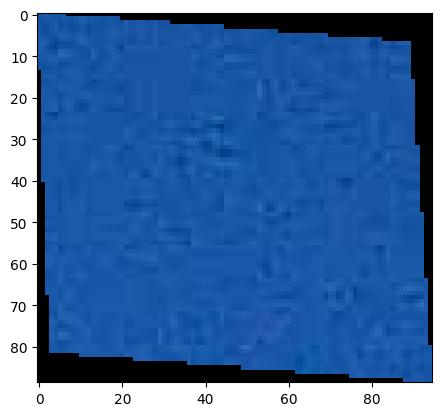

1


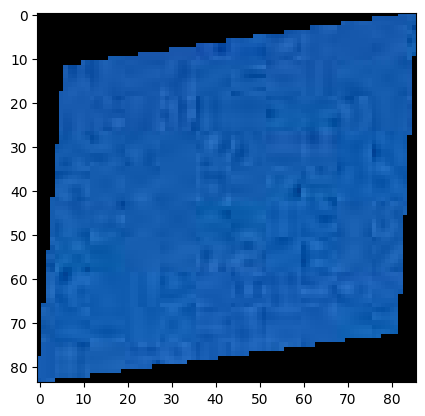

1


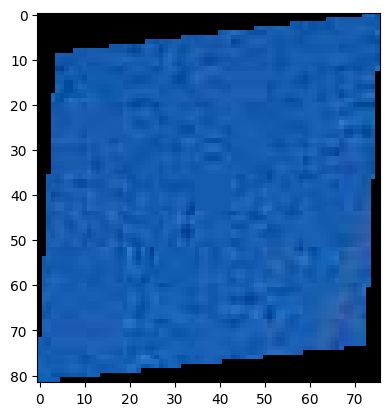

1


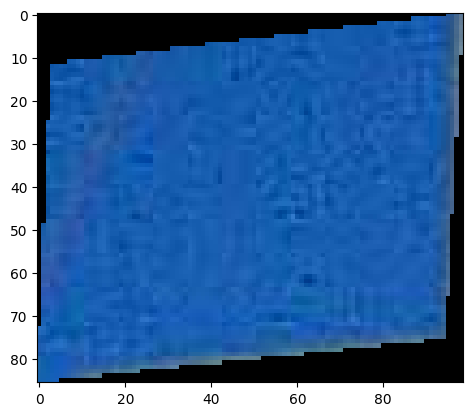

0


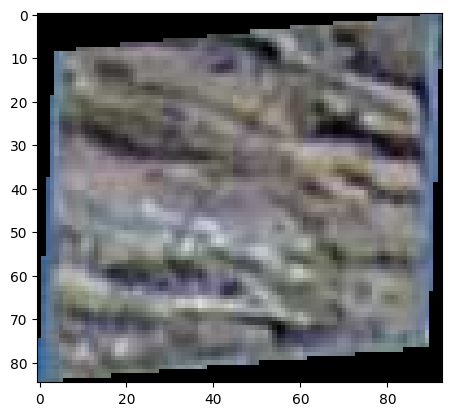

1


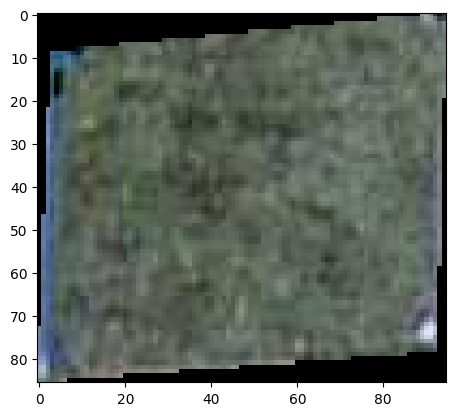

1


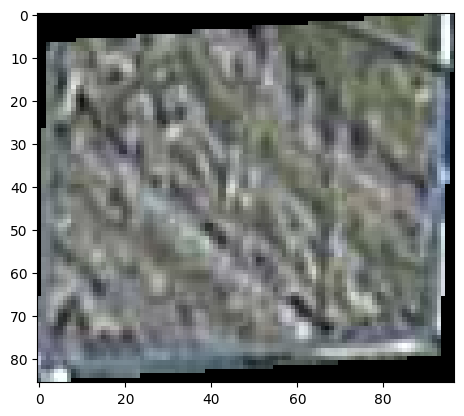

1


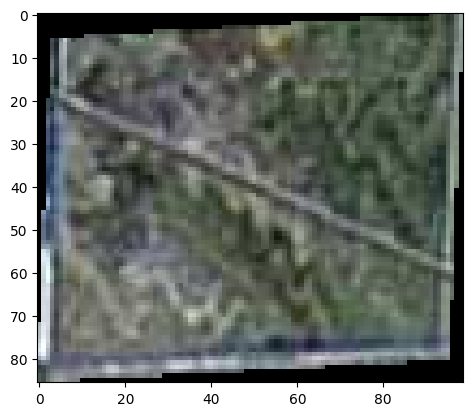

1


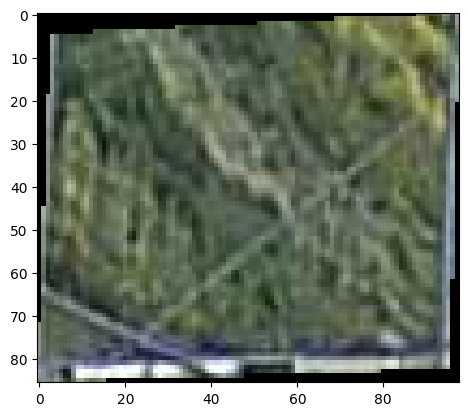

In [76]:
for lab_id, img_mirror in zip(labels[:25], mirrors_color_list[:25]):
    print(lab_id)
    plt.figure()
    plt.imshow(img_mirror)
    plt.show()

In [49]:
scaled_data

array([[-0.21632303, -0.765448  , -0.65235484, ..., -0.05892557,
         0.        ,  0.        ],
       [-0.56767255, -0.765448  , -0.65235484, ..., -0.05892557,
         0.        ,  0.        ],
       [-0.40026477, -0.765448  , -0.65235484, ..., -0.05892557,
         0.        ,  0.        ],
       ...,
       [ 3.882441  , -0.10933953, -0.6282767 , ..., -0.05892557,
         0.        ,  0.        ],
       [ 3.9750896 ,  0.88943326, -0.18709375, ..., -0.05892557,
         0.        ,  0.        ],
       [ 3.9599    , -0.06065819, -0.25421768, ..., -0.05892557,
         0.        ,  0.        ]], dtype=float32)